# Can we accurately predict precipitation rates in London?

Group 34: Aronn Grant Laurel Y., Mina Chen, Anabel Iris Eliora Hartanto, Farhan Ihsas Hoque

## Introduction

London, being one of England’s major business hubs, is also one of the busiest cities in the world. As there is a constant flow of people getting from one place to another, rain can lead to significant disruptions in traffic that may cause delays and increase commuting time. Hence, it is important for commuters to anticipate any rain before planning their trip. In this study, we will be using a london weather dataset by the European Climate Assessment & Dataset ( https://www.ecad.eu/dailydata/index.php ) and attempt to accurately predict precipitation rates in London by using K-nearest neighbor regression. The dataset obtained covers the daily weather measurements recorded by a weather station in London, UK with each row as a day’s observation spanning from 1979 - 2020. 

The dataset contains 10 columns show below:

`date` : Recorded date of measurement - (int)

`cloud_cover` : Cloud cover measurement in oktas

`sunshine` : Sunshine measurement in hours (hrs)

`global_radiation` : Irradiance measurement in Watt per square meter (W/m2)

`max_temp` : Maximum temperature recorded in degrees Celsius (°C) 

`mean_temp` : Mean temperature in degrees Celsius (°C) 

`min_temp` : Minimum temperature recorded in degrees Celsius (°C) 

`precipitation` : Precipitation measurement in millimeters (mm)

`pressure` : Pressure measurement in Pascals (Pa) 

`snow_depth` : Snow depth measurement in centimeters (cm)

We will be experimenting with all weather measurements to determine which factor has the best relationship with precipitation for the rain prediction.

## Preliminary exploratory data analysis

In [1]:
# Load libraries
library(repr)
library(tidyverse)
library(tidymodels)

── Attaching packages ─────────────────────────────────────── tidyverse 1.3.2 ──
✔ ggplot2 3.4.2     ✔ purrr   1.0.1
✔ tibble  3.2.1     ✔ dplyr   1.1.1
✔ tidyr   1.3.0     ✔ stringr 1.5.0
✔ readr   2.1.3     ✔ forcats 0.5.2
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
── Attaching packages ────────────────────────────────────── tidymodels 1.0.0 ──

✔ broom        1.0.2     ✔ rsample      1.1.1
✔ dials        1.1.0     ✔ tune         1.0.1
✔ infer        1.0.4     ✔ workflows    1.1.2
✔ modeldata    1.0.1     ✔ workflowsets 1.0.0
✔ parsnip      1.0.3     ✔ yardstick    1.1.0
✔ recipes      1.0.4     

── Conflicts ───────────────────────────────────────── tidymodels_conflicts() ──
✖ scales::discard() masks purrr::discard()
✖ dplyr::filter()   masks stats::filter()
✖ recipes::fixed()  masks stringr::fixed()
✖ dplyr::lag()      masks stats::lag()
✖ yardstick::spec() masks read

First, we use `read_csv()` function to read the processed dataset for the weather in London. We use the `head` function to read the first few rows of **weather_data**.

-Do we as factor?-

weather_data_mutate <- weather_data |>
                            mutate(rain_level = ifelse(precipitation < 2.5, "Light_Rain", ifelse(precipitation > 50, "Violent_Rain", ifelse(precipitation < 10, "Moderate_Rain", "Heavy_Rain"))) )
weather_data_mutate

In [14]:
weather_data <- read_csv("data/london_weather.csv")
head(weather_data)

Rows: 15341 Columns: 10
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
dbl (10): date, cloud_cover, sunshine, global_radiation, max_temp, mean_temp...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


date,cloud_cover,sunshine,global_radiation,max_temp,mean_temp,min_temp,precipitation,pressure,snow_depth
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
19790101,2,7.0,52,2.3,-4.1,-7.5,0.4,101900,9
19790102,6,1.7,27,1.6,-2.6,-7.5,0.0,102530,8
19790103,5,0.0,13,1.3,-2.8,-7.2,0.0,102050,4
19790104,8,0.0,13,-0.3,-2.6,-6.5,0.0,100840,2
19790105,6,2.0,29,5.6,-0.8,-1.4,0.0,102250,1
19790106,5,3.8,39,8.3,-0.5,-6.6,0.7,102780,1


Now, we will begin train, evaluate, and tune the model by partitioning `weather_data` into training and testing set with a proportion of 75% and 25% of the dataset respectively using.

After splitting the data with the `initial_split` function, we will pass it to `weather_training` and `weather_testing` to create the training and testing set.

In [15]:
weather_split <- initial_split(weather_data, prop = 0.75, strata = precipitation)

weather_training <- training(weather_split)

weather_testing <- testing(weather_split)

Using the training data from above, we will visualize the data with a scatterplot to compare the 2 variables including the precipitaiton, which is what we are attempting to predict

Warning message:
“Removed 17 rows containing missing values (`geom_point()`).”


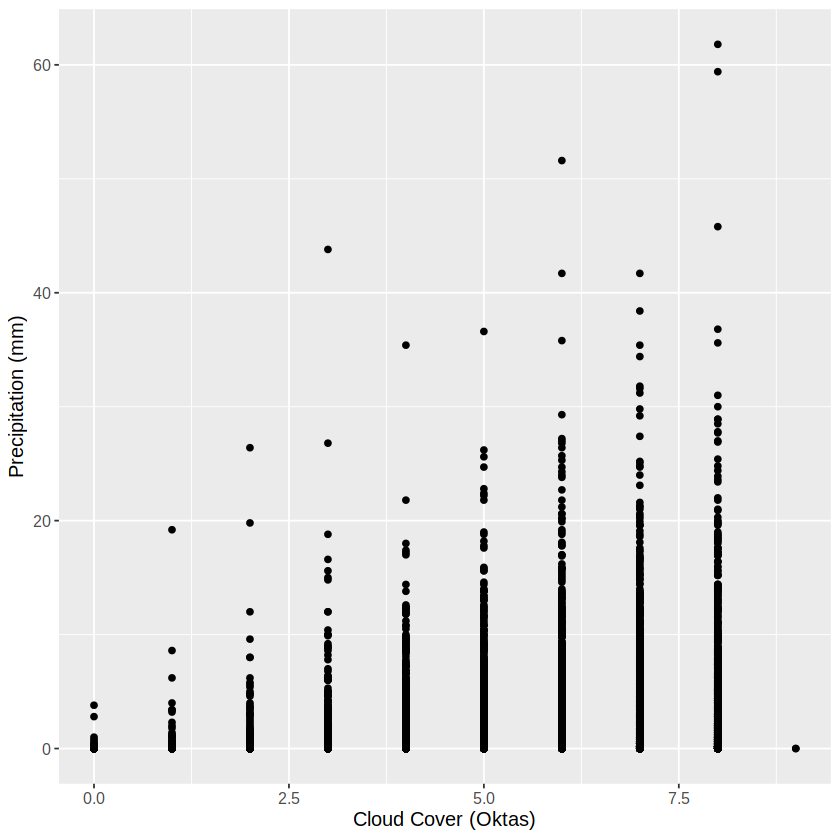

In [16]:
cloud_rain_plot <- weather_training |>
                    ggplot( aes(x = cloud_cover, y = precipitation) ) +
                    geom_point() + 
                    labs(x = "Cloud Cover (Oktas)", y = "Precipitation (mm)") +
                    theme(text = element_text(size = 12))
cloud_rain_plot

Warning message:
“Removed 28 rows containing missing values (`geom_point()`).”


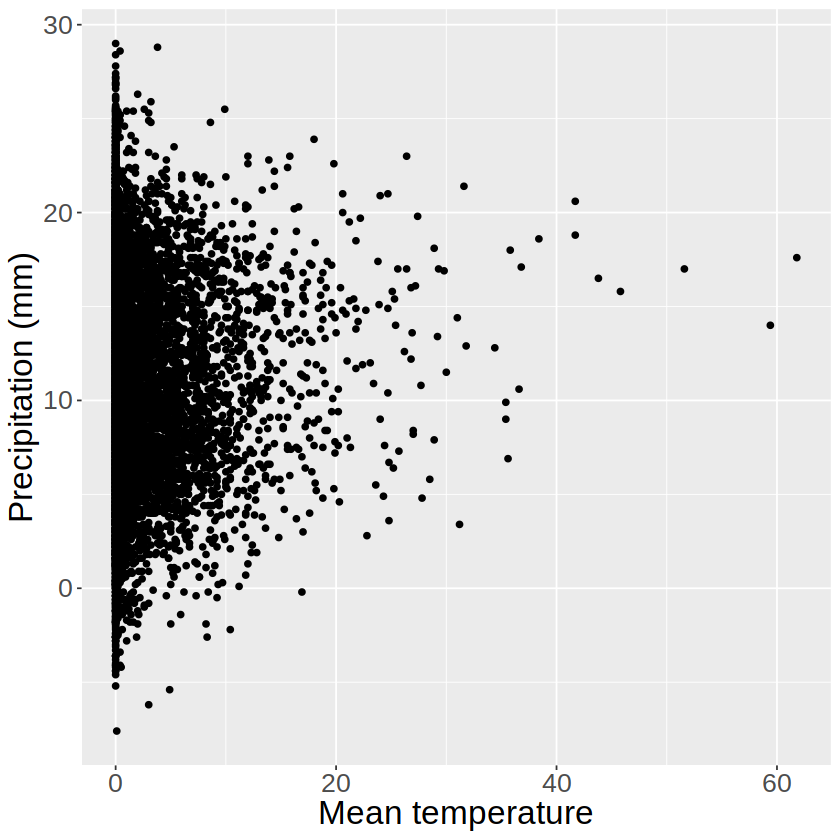

In [24]:
temp_rain_plot <- weather_training |>
                    ggplot( aes(x = precipitation, y = mean_temp) ) +
                    geom_point() + 
                    labs(x = "Mean temperature", y = "Precipitation (mm)") +
                    theme(text = element_text(size = 20))
temp_rain_plot

sun_rain_plot <- weather_training |>
                    ggplot( aes(x = sunshine, y = mean_temp) ) +
                    geom_point() + 
                    labs(x = "Sunshine (hrs in a day)", y = "Mean Temperature (C)") +
                    theme(text = element_text(size = 20))
sun_rain_plot

Warning message:
“Removed 30 rows containing missing values (`geom_point()`).”


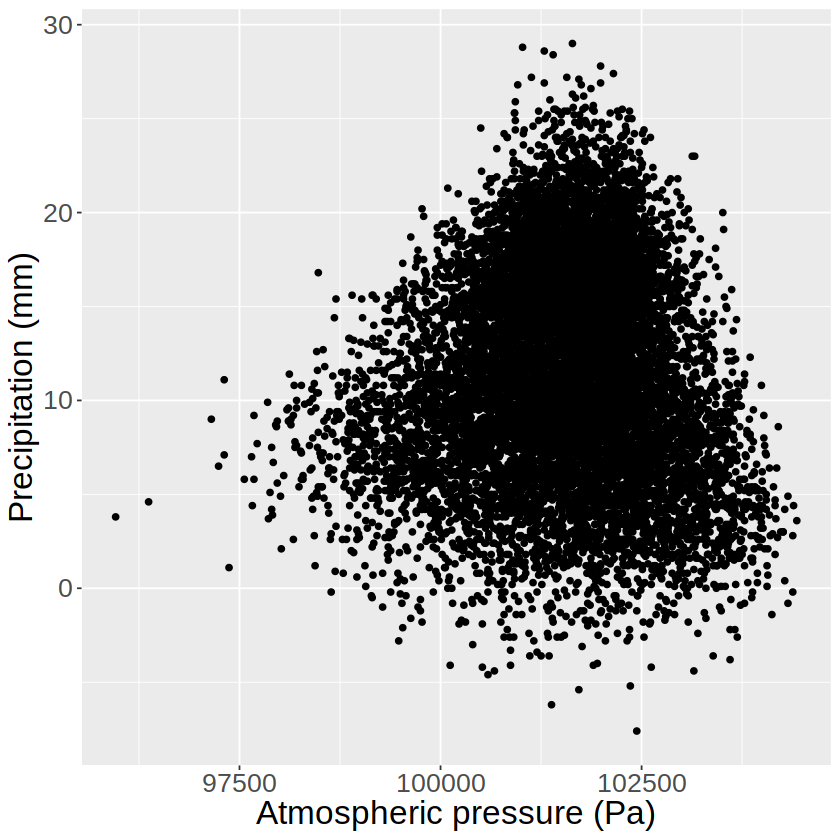

In [22]:
pressure_rain_plot <- weather_training |>
                    ggplot( aes(x = pressure, y = mean_temp) ) +
                    geom_point() + 
                    labs(x = "Atmospheric pressure (Pa)", y = "Mean Temperature (C)") +
                    theme(text = element_text(size = 20))
pressure_rain_plot

Warning message:
“Removed 42 rows containing missing values (`geom_point()`).”


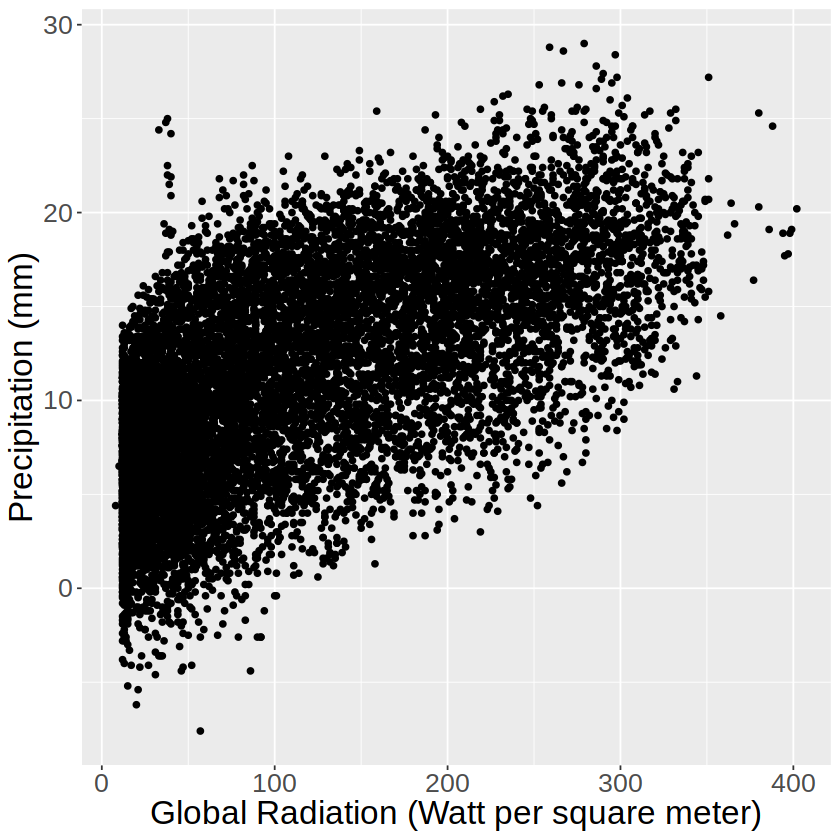

In [21]:
radiation_rain_plot <- weather_training |>
                    ggplot( aes(x = global_radiation, y = mean_temp) ) +
                    geom_point() + 
                    labs(x = "Global Radiation (Watt per square meter)", y = "Mean Temperature (C)") +
                    theme(text = element_text(size = 20))
radiation_rain_plot

### Findings from the plot
-PLS DO-

# Methods

##  Explain how you will conduct either your data analysis and which variables/columns you will use.


## Describe at least one way that you will visualize the results

# Expected outcomes and Significance

## What do you expect to find?
We expect to find that precipitation levels can be predicted dependent on other correlated measurements of weather factors. These include the daily mean temperature, radiation, cloud cover, sunshine and pressure. We specifically anticipate that higher levels of precipitation occur in specific weather conditions, such as lower mean temperature, reduced sunshine and radiation, increased cloud cover, and higher pressure measurements. 

## What impact could such findings have?
This analysis of historical weather data in London would provide valuable insights to current weather forecasting systems, specifically in predicting high levels of precipitation that may risk to the occurrence of dangerous and rapid flash floods. These findings would also be beneficial in providing a better understanding of environmental processes and impact of global changes on London’s weather patterns.

## What future questions could this lead to?
-PLS DO-